# Проектная работа "Рынок заведений общественного питания Москвы"

# Введение

## Предобработка данных

### Ознакомление с данными

In [41]:
# Испортируем необходимые для работы библиотеки:

import pandas as pd
import re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go 
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import scipy.stats as stats

In [42]:
# Откроем датасет и сохраним его в переменную data

data = pd.read_csv ('/datasets/moscow_places.csv')

# Выведем на экран информацию о датасете:
display (data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

In [43]:
# Выведем на экран первые 5 строк датасета:
display (data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


После первичного ознакомления с предоставленными данными и их структурой мы видим, что в датасете представлена информация о 8406 заведениях в Москве. Больше половины стобцов содержит информацию строкового типа, практически все остальные - вещественные числа, и лишь один столбец - информацию типа "целое число". В целом представленные типы данных адекватны типу хранящейся информации, кроме столбца с количеством посадочных мест - необходимо изменить тип данных на int64, поскольку количеств посадочных мест - всегда целое число.

In [44]:
# Приведем данные в столбце seats к типу int64:

data['seats'] = data['seats'].astype ('int64', errors = 'ignore')

### Проверка данных на дубликаты

In [45]:
# Проверим, есть ли в данных дубликаты:

data.duplicated().sum()

0

Мы видим, что в датасете отсутствуют так называемые полные дубликаты. 

In [46]:
# Приведем столбец с названиями к нижнему регистру:
data ['name'] = data['name'].str.lower()

In [47]:
# Проверим дубликаты по адресу и названию заведения:

data [data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [48]:
# Удалим строки с дубликатами в адресе и названии:

data[['name', 'address']]  = data[['name', 'address']].drop_duplicates()

Проверим на наличие неявных дубликатов в столбце с адресом:

In [49]:
# Проверим, сколько уникальных значений в столбце с адресом:
display (data['address'].nunique())

# Сохраним строки с повторяющимися адресами в переменную
duplicated_rows = data [data['address'].duplicated()]

# Рассчитаем сколько заведений находится по каждому их таких адресов:
display (duplicated_rows.groupby ('address')['address'].count().unique())

5753

array([ 1,  4,  3,  2,  5,  6,  9,  7, 10,  8, 15, 13, 14, 25, 18, 19, 11,
       27])

Мы видим, что есть адреса, по которым находится более одного заведения, что в целом вполне нормально. Однако в датасете присутствуют адреса, где расположено больше 10 заведений общепита. Это может быть как ошибкой в данных, так и вполне объяснимой ситуацией (например, фудкорт в торговом центре). 

Проверим на наличие неявных дубликатов в столбцах с названиями категорий и районов.


In [50]:
# Проверим, сколько уникальных значений в столбце с категориями:

display (data['category'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [51]:
# Проверим, сколько уникальных значений в столбце с районом:
display (data['district'].unique())

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Дубликатов в этих столбцах не обнаружено.

### Проверка данных на наличие пропусков:

In [52]:
# Проверим датасет на наличие пропусков:

data.isna().sum()

name                    3
category                0
address                 3
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Мы видим, что в некоторых столбцах присутствуют пропуски. Речь идет о столбцах с днями и часами работы, ценовым сегментом, средним чеком и количеством посадочных мест. Наибольший интерес для целей исследования представляют пропуски с информацией о среднем чеке. Так как данные в столбцах middle_avg_bill и middle_coffee_cup напрямую зависят от данных в столбце avg_bill, можно попробовать восстановить пропуски там, где это представляется возможным сделать.

In [53]:
# Проверим пропуски в столбце middle_avg_bill, которые можно восстановить
data [(data['avg_bill'].isna()==False)&
      (data['avg_bill'].str.contains(r'\Средний счёт'))&
      (data['middle_avg_bill'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [54]:
# Проверим пропуски в столбце middle_coffee_cup, которые можно восстановить
data [(data['avg_bill'].isna()==False)&
      (data['avg_bill'].str.contains(r'\Цена одной чашки капучино'))&
      (data['middle_coffee_cup'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Мы убедились, что пропуски в столбцах middle_avg_bill и middle_coffee_cup неслучайны и связаны с данными в столбце avg_bill.

### Добавление столбцов

In [55]:
# Создадим столбец street с названиями улиц из столбца с адресом:

data['street'] = data['address'].str.split(', ').str[1]

# Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

data['is_24/7'] = data['hours'].str.contains(r'\ежедневно, круглосуточно')

In [56]:
# Выведем первые 5 строк датасета:
display (data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Проверка числовых данных на наличие выбросов

In [57]:
# Проверим на наличие выбросов столбец с рейтингом заведений:

data ['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

В столбце с рейтингом заведений выбросов не обнаружено.

In [58]:
# Проверим на наличие выбросов столбец со средним чеком в заведениях:

data ['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

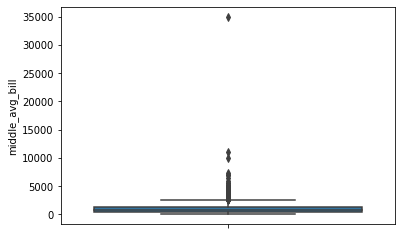

In [59]:
# Построим "ящик с усами":

sns.boxplot (y = data['middle_avg_bill']);

Мы видим на графике некоторое число выбросов и границу аномалий на отметке в 3000 рублей. Выведем на экран информацию о заведениях, в которых средний чек превышает это значение. 

In [60]:
# Найдем заведения с аномально высоким средним чеком:

data[data ['middle_avg_bill']>3000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
317,vоdный,ресторан,"Москва, Ленинградское шоссе, 39, стр. 6",Северный административный округ,"ежедневно, 12:00–00:00",55.834978,37.479791,4.7,высокие,Средний счёт:4500–5500 ₽,5000.0,NaN,0,286.0,Ленинградское шоссе,False
354,стар самарканд,ресторан,"Москва, Ленинградское шоссе, 84, стр. 1",Северный административный округ,"ежедневно, 07:00–02:00",55.848269,37.475768,4.4,высокие,Средний счёт:1500–5000 ₽,3250.0,NaN,0,84.0,Ленинградское шоссе,False
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0,Дмитровское шоссе,False
754,золотая роща,ресторан,"Москва, улица Бестужевых, 14, корп. 1",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.871153,37.609928,4.3,высокие,Средний счёт:3500–4000 ₽,3750.0,NaN,0,300.0,улица Бестужевых,False
1125,на мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,NaN,проспект Мира,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5724,garum,ресторан,"Москва, Мичуринский проспект, 16",Западный административный округ,"пн-пт 15:00–01:00; сб,вс 13:00–23:00",55.702328,37.505930,4.5,высокие,Средний счёт:2000–5000 ₽,3500.0,NaN,0,60.0,Мичуринский проспект,False
5978,буйабес,ресторан,"Москва, Ленинский проспект, 37",Южный административный округ,"ежедневно, 12:00–23:00",55.711015,37.586544,4.2,высокие,Средний счёт:от 3500 ₽,3500.0,NaN,0,96.0,Ленинский проспект,False
6349,дудук,ресторан,"Москва, улица Симоновский Вал, 26, корп. 2",Южный административный округ,"ежедневно, 11:00–23:00",55.718072,37.661702,4.6,высокие,Средний счёт:2500–4500 ₽,3500.0,NaN,0,130.0,улица Симоновский Вал,False
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,Каширское шоссе,True


In [61]:
# Удалим из датасета строки с выбросами:

data = data.drop(np.where(data['middle_avg_bill']>3000)[0])


Также можно заметить, что для некоторых заведений показатель среднего чека равен 0, что также может быть результатом ошибки.

In [62]:
# Выведем на экран строки с заведениями, в которых средний чек равен 0:

data[data ['middle_avg_bill']==0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0,улица Новый Арбат,True


Речь идет об одном заведении, поэтому для целей анализа представляется целесообразным удалить эту строку.

In [63]:
# Удалим строку с заведением, в котором средний чек равен 0:

data = data.drop(np.where (data ['middle_avg_bill']==0)[0])

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

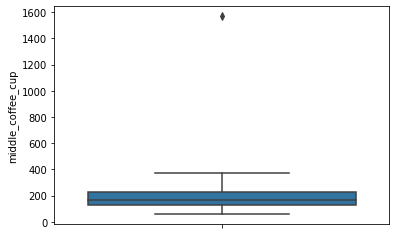

In [64]:
# Проверим на наличие выбросов столбец со стоимостью чашки капучино в заведениях:

display (data ['middle_coffee_cup'].describe())
sns.boxplot (y = data['middle_coffee_cup']);

Мы видим, что граница аномального значения установилась на отметке в 400 рублей. Выведем на экран информацию о заведениях, в которых стоимость чашки капучино превышает это значение. 

In [65]:
# Найдем заведения с аномально высокой стоимостью чашки капучино:

data[data ['middle_coffee_cup']>400]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,Большая Семёновская улица,False


Мы видим, что в датасете есть только одно такое заведение, и речь очевидно идет об опечатке: верхняя граница диапазона стоимости кофе составляет 290, а не 2907 рублей. Исправим эту опечатку.

In [66]:
# Исправим значения в столбцах avg_bill и middle_coffee_cup для строки с опечаткой:

data.at [2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.at [2859, 'middle_coffee_cup'] = 260

count    4752.000000
mean      108.054503
std       122.172679
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

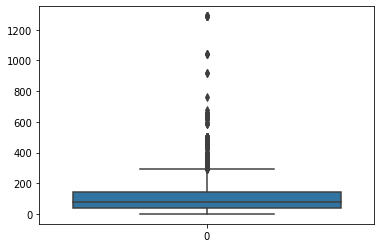

In [67]:
# Проверим на наличие выбросов столбец с количеством посадочных мест в заведениях:

display (data ['seats'].describe())

sns.boxplot (data = data['seats']);

Мы видим на графике некоторое число выбросов и границу аномалий на отметке в 300 посадочных мест. Выведем на экран информацию о заведениях, в которых число посадочных мест превышает это значение. 

In [68]:
# Выведем на экран строки с заведениями, в которых больше 300 посадочных мест:

data[data['seats']>300]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
127,арарат,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914310,37.538953,4.2,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
171,one price coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909838,37.541526,4.0,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
176,вуди пицца,пиццерия,"Москва, Дмитровское шоссе, 107А, корп. 1",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.878504,37.540110,4.0,средние,Средний счёт:400–600 ₽,500.0,NaN,0,350.0,Дмитровское шоссе,False
194,ленкорань,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914574,37.539103,1.4,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
216,грузинский бульвар,быстрое питание,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909115,37.540112,4.0,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8171,монстер хиллс,ресторан,"Москва, Автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.705457,37.638930,4.0,средние,Средний счёт:600–1200 ₽,900.0,NaN,0,455.0,Автозаводская улица,False
8198,милти,быстрое питание,"Москва, улица Ленинская Слобода, 19",Южный административный округ,пн-пт 09:00–19:00,55.708303,37.652822,3.8,NaN,NaN,NaN,NaN,0,450.0,улица Ленинская Слобода,False
8237,pasta cup & pinsa,пиццерия,"Москва, Автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.704647,37.639556,3.5,средние,Средний счёт:450–700 ₽,575.0,NaN,0,455.0,Автозаводская улица,False
8315,чайхана бишкек,ресторан,"Москва, Тихорецкий бульвар, 2, корп. 1",Юго-Восточный административный округ,"ежедневно, 09:00–01:30",55.679190,37.776553,4.1,NaN,NaN,NaN,NaN,0,305.0,Тихорецкий бульвар,False


Таких заведений в датасете оказалось аж 250, поэтому представляется целесообразным оставить их в датасете, дабы не терять важные данные по остальным показателям

## Анализ данных

### Категории заведений

In [69]:
# Выведем на экран все уникальные значения из столбца category: 

data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [70]:
# Посчитаем количество заведений для каждой категории и отсортируем по убыванию:

category = data.groupby('category')['name'].count().sort_values(ascending = False)
display (category)

category
кафе               2374
ресторан           1997
кофейня            1412
бар,паб             754
пиццерия            633
быстрое питание     601
столовая            314
булочная            256
Name: name, dtype: int64

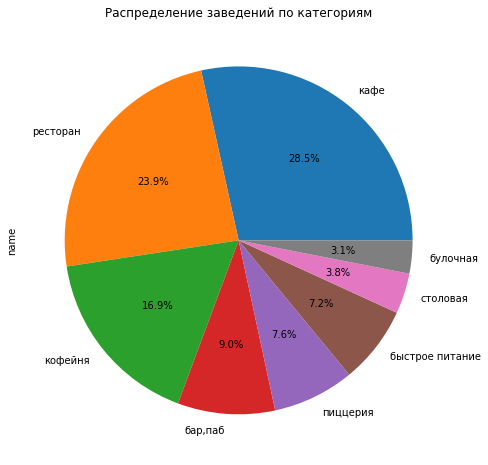

In [71]:
# Построим круговую диаграмму и отразим долю заведений каждой категории от общего числа:

category.plot (kind='pie', figsize = (12,8), autopct='%1.1f%%')
plt.title('Распределение заведений по категориям');

Мы видим, что заведения по категориям распределились следующим образом:
- больше всего в Москве кафе (более 28%) и ресторанов (почти 24%); 
- чуть меньше кофеен (менее 17% от общего числа заведений);
- далее следуют бары и пабы (9%), пиццерии (7,6%) и заведения быстрого питания (чуть больше 7%);
- в конце списка расположились столовые (чуть меньше 4%) и булочные (3% от общего числа заведений).

### Количество посадочных мест по категориям

Сначала проанализируем усредненные данные по каждой из категорий.

In [72]:
# Рассчитаем медианное число посадочных мест для каждой из категорий заведений:

category_seats = data.pivot_table (index = 'category', values = 'seats', aggfunc = 'median').sort_values(by='seats')
category_seats = category_seats.reset_index()
display (category_seats)

,category,seats
0,булочная,50.0
1,пиццерия,55.0
2,кафе,60.0
3,быстрое питание,67.0
4,столовая,75.0
5,кофейня,80.0
6,"бар,паб",82.0
7,ресторан,85.5


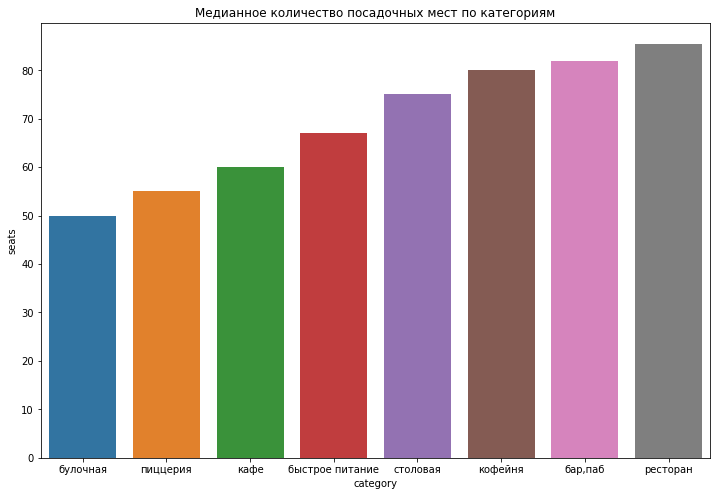

In [73]:
# Построим график:

plt.figure(figsize=(12, 8))
plt.title ('Медианное количество посадочных мест по категориям')
sns.barplot (data = category_seats, x = 'category', y = 'seats');

Мы видим, что в среднем для всех категорий заведений медианное число посадочных мест находится в диапазоне от 50 до 86. Меньше всего посадочных мест в заведениях, рассчитанных на кратковременное пребывание посетителей и их частую смену - булочных, пиццериях, заведениях быстрого питания и кафе. Заведения, рассчитанные на более долгое пребывания посетителя - бары, пабы, кофейни и рестораны, имеют в среднем большее число посадочных мест. Исключением можно считать столовые, которые сочетают в себе и большое число посадочных мест и быстроту обслуживания. 

### Сетевые и несетевые заведения

In [74]:
# Рассчитаем количество сетевых и несетевых заведений в датасете:

print ('Количество сетевых заведений:', data[data['chain']==1]['name'].count())
print ('Количество несетевых заведений:', data[data['chain']==0]['name'].count())

Количество сетевых заведений: 3198
Количество несетевых заведений: 5143


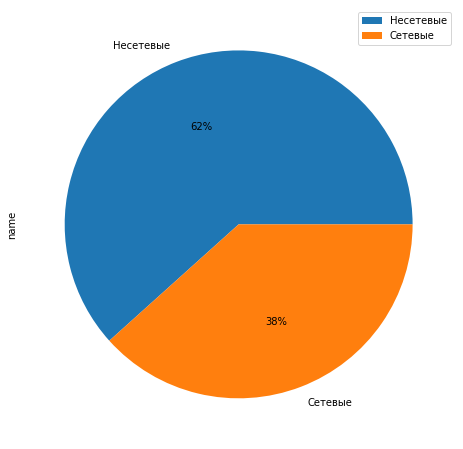

In [75]:
# Отразим соотношение на круговой диаграмме:

data.groupby ('chain')['name'].count().plot (
    kind = 'pie', labels = ['Несетевые', 'Сетевые'], autopct='%1.0f%%', figsize = (12,8))
plt.legend();

Итак, расчет показал, что несетевых заведений в датасете значительно больше (62% против 38%). 

Теперь можем проанализировать соотношение сетевых и несетевых заведений в разрезе по категориям.

In [76]:
# Создадим сводную таблицу, в которой отразим количестве сетевых и несетевых заведений по категориям:

category_chain = data.pivot_table (index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
category_chain.columns = ['non_chain', 'chain']

# Рассчитаем доли сетевых и несетевых заведений по категориям:

category_chain ['chain_rate'] = category_chain ['chain'] / (category_chain ['non_chain'] + category_chain ['chain']) * 100
category_chain ['non_chain_rate'] = category_chain ['non_chain'] / (category_chain ['non_chain'] + category_chain ['chain']) * 100
category_chain = category_chain.drop (columns = ['non_chain', 'chain'])
category_chain.columns = ['Сетевые', 'Несетевые']
category_chain = category_chain.sort_values (by='Сетевые')
display (category_chain)

,Сетевые,Несетевые
category,,
"бар,паб",22.148541,77.851459
столовая,28.025478,71.974522
кафе,32.813816,67.186184
ресторан,36.404607,63.595393
быстрое питание,38.269551,61.730449
кофейня,50.991501,49.008499
пиццерия,52.132701,47.867299
булочная,61.328125,38.671875


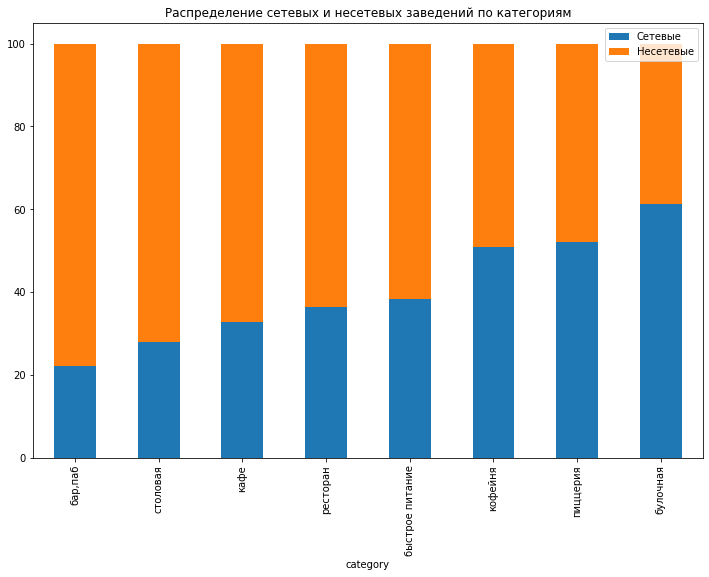

In [77]:
# Построим столбчатую диаграмму с разделением по категориям и сетевым/несетевым заведениям

category_chain.plot(kind = 'bar', stacked = True, 
                    title='Распределение сетевых и несетевых заведений по категориям', figsize = (12,8));


На графике видно, что для большинства категорий заведений справедливо то, что несетевые заведения преобладают над сетевыми. Однако для булочных и кофеен ситуация обратная: сетевых заведений больше, чем несетевых (61% для булочных и почти 51% для кофеен). Самый низкий процент сетевых заведений у баров и пабов - чуть больше 20%.

### Топ-15 популярных сетей

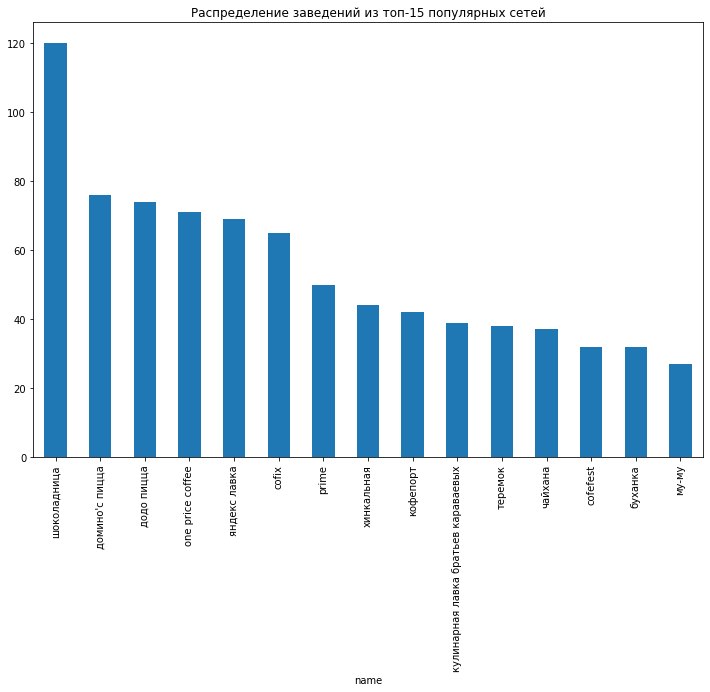

In [78]:
# Найдем топ-15 самых популярных сетей:

top15 = data[data['chain']==1].groupby('name')[['name', 'address']].count().sort_values(by = 'address', ascending = False).head(15)
top15.columns = ['count', 'address']

# Отразим распределение заведений из топ-15 популярных сетей на круговой диаграмме:
top15.plot (kind = 'bar', figsize = (12,8), y = 'count', legend = False)
plt.title ('Распределение заведений из топ-15 популярных сетей');


In [79]:
# Отразим распределение топ-15 сетей по категориям заведений:

top15 = top15.reset_index().drop (columns = ['address'], axis = 1)
top15_category = data[data['chain']==1].groupby('name')[['name','category']].first().drop (columns = ['name']).reset_index()
top15 = top15.merge (top15_category, on = 'name', how = 'left')

display (top15)


,name,count,category
0,шоколадница,120,кофейня
1,домино'с пицца,76,пиццерия
2,додо пицца,74,пиццерия
3,one price coffee,71,кофейня
4,яндекс лавка,69,ресторан
5,cofix,65,кофейня
6,prime,50,ресторан
7,хинкальная,44,быстрое питание
8,кофепорт,42,кофейня
9,кулинарная лавка братьев караваевых,39,кафе


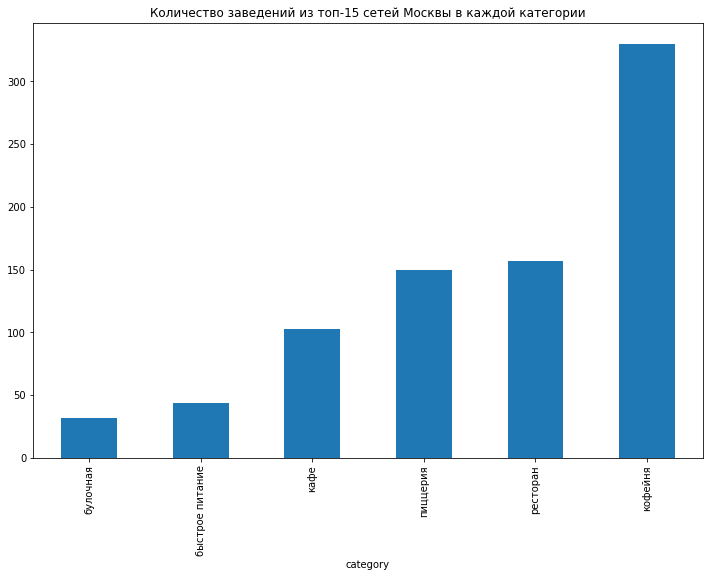

In [80]:
# Построим столбчатую диаграмму и отразим количество заведений из топ-15 сетей Москвы в каждой категории:
top15.groupby('category')['count'].sum().sort_values().plot(kind = 'bar', x = 'category', figsize = (12,8))
plt.title ('Количество заведений из топ-15 сетей Москвы в каждой категории');

Мы видим, что в топе-15 сетей Москвы с большим отрывом преобладают кофейни, а бары, пабы и столовые вообще не представлены. 

In [81]:
# Сохраним в список названия сетевых заведений из топ-15:
top15_names = top15['name'].tolist()

# Сделаем срез из изначального датасета с данными о заведениях из топ-15
data.query ('name in @top15_names')

# Создадим сводную таблицу с информацией о количестве заведений каждой категории по районам:
top15_district = data.query ('name in @top15_names').pivot_table (
    index = 'district', columns = 'category', values = 'address', aggfunc = 'count')

# Добавим столбец с общим числом заведений для каждого округа и отсортируем таблицу по нему:
top15_district ['total'] = top15_district[[
    'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
top15_district = top15_district.sort_values (by='total')

In [82]:
# Выведем сводную таблицу на экран: 
top15_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Северо-Западный административный округ,NaN,3.0,2.0,1.0,20.0,13.0,7.0,NaN,46.0
Юго-Восточный административный округ,NaN,NaN,2.0,12.0,15.0,16.0,11.0,NaN,56.0
Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,NaN,70.0
Восточный административный округ,2.0,1.0,2.0,6.0,30.0,21.0,18.0,1.0,81.0
Северо-Восточный административный округ,NaN,6.0,2.0,6.0,37.0,19.0,15.0,NaN,85.0
Западный административный округ,NaN,5.0,1.0,8.0,41.0,15.0,18.0,NaN,88.0
Северный административный округ,NaN,8.0,NaN,7.0,40.0,20.0,13.0,NaN,88.0
Южный административный округ,NaN,NaN,NaN,4.0,34.0,23.0,28.0,NaN,89.0
Центральный административный округ,1.0,1.0,2.0,47.0,95.0,9.0,59.0,1.0,215.0


In [83]:
# Удалим столбец с общим числом заведений для каждого округа:
top15_district = top15_district.drop (columns = ['total'], axis = 1)

# Выведем сводную таблицу на экран: 
top15_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Северо-Западный административный округ,NaN,3.0,2.0,1.0,20.0,13.0,7.0,NaN
Юго-Восточный административный округ,NaN,NaN,2.0,12.0,15.0,16.0,11.0,NaN
Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,NaN
Восточный административный округ,2.0,1.0,2.0,6.0,30.0,21.0,18.0,1.0
Северо-Восточный административный округ,NaN,6.0,2.0,6.0,37.0,19.0,15.0,NaN
Западный административный округ,NaN,5.0,1.0,8.0,41.0,15.0,18.0,NaN
Северный административный округ,NaN,8.0,NaN,7.0,40.0,20.0,13.0,NaN
Южный административный округ,NaN,NaN,NaN,4.0,34.0,23.0,28.0,NaN
Центральный административный округ,1.0,1.0,2.0,47.0,95.0,9.0,59.0,1.0


In [84]:
# Построим столбчатую диаграмму с накоплением:

fig = px.bar(top15_district, color="category", title ="Распределение заведений из топ-15 по категориям и районам", height=800)
fig.show()


График демонстрирует существенное лидерство ЦАО Москвы по количеству заведений из топ15.

### Распределение заведений по районам

In [85]:
# Выведем на экран названия всех упомянутых в датасете районов:

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Мы видим, что в датасете представлены все административные районы Москвы, кроме Зеленоградского, Троицкого и Новомосковского.

In [86]:
# Построим сводную таблицу с распределением заведений различных категорий по районам:
district_category = data.pivot_table (
    index = 'district', columns = 'category', values = 'address', aggfunc = 'count')

# Добавим столбец с общим числом заведений для каждого округа и отсортируем таблицу по нему:
district_category ['total'] = district_category[[
    'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
district_category = district_category.sort_values (by='total')
display (district_category)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Юго-Восточный административный округ,38,13,67,281,89,55,145,25,713
Восточный административный округ,53,25,70,272,105,72,159,40,796
Западный административный округ,50,37,62,238,150,71,213,23,844
Северо-Восточный административный округ,62,28,82,268,159,68,180,40,887
Южный административный округ,68,25,85,264,131,73,199,44,889
Северный административный округ,66,39,58,234,193,77,184,41,892
Центральный административный округ,356,50,86,464,427,113,640,66,2202


In [87]:
# Удалим столбец с общим числом заведений для каждого округа:
district_category = district_category.drop (columns = ['total'], axis = 1)

# Выведем сводную таблицу на экран: 
district_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Юго-Восточный административный округ,38,13,67,281,89,55,145,25
Восточный административный округ,53,25,70,272,105,72,159,40
Западный административный округ,50,37,62,238,150,71,213,23
Северо-Восточный административный округ,62,28,82,268,159,68,180,40
Южный административный округ,68,25,85,264,131,73,199,44
Северный административный округ,66,39,58,234,193,77,184,41
Центральный административный округ,356,50,86,464,427,113,640,66


In [88]:
# Построим столбчатую диаграмму с накоплением:

fig = px.bar(district_category, color="category", title ="Распределение заведений по категориям и районам", height=800)
fig.show()

График позволяет сделать следующие выводы: 
- в ЦАО находится около 2500 заведений, что в несколько раз больше, чем в любом другом из административных районов Москвы, 
- в разрезе по категориям мы видим в ЦАО большую долю ресторанов, баров и пабов и кофеен, чем в других районах,
- доля столовых в ЦАО напротив, существенно ниже, чем в других районах;
- количество заведений быстрого питания приблизительно одинаковое вне зависимости от района;
- количество заведений в остальных районах (кроме СЗАО) находится приблизительно в одном диапазоне (от 750 до 1000);
- меньше всего заведений находится в СЗАО (около 400).

### Распределение средних рейтингов по категориям заведений

In [89]:
# Рассчитаем значение среднего рейтинга для каждой категории заведений:

data.groupby ('category')['rating'].mean().reset_index()

,category,rating
0,"бар,паб",4.385563
1,булочная,4.268359
2,быстрое питание,4.050083
3,кафе,4.125095
4,кофейня,4.277054
5,пиццерия,4.301264
6,ресторан,4.285035
7,столовая,4.211465


In [90]:
# Построим гистограмму, отражающую средний рейтинг заведений по категориям:

fig = px.histogram(data.groupby ('category')['rating'].mean().reset_index().sort_values(by='rating'), 
                   x="category", y = 'rating', title = 'Средний рейтинг заведений по категориям')
fig.show()

Гистограмма демонстрирует, что значения среднего рейтинга не сильно варьируются по категориям заведений и находятся в диапазоне от 4 до 4,4. Наименьшее значение предсказуемо показывают заведения быстрого питания, наибольшее - бары и пабы.

In [91]:
# Построим диаграммы размаха:

fig = px.box(data, x = 'category', y="rating")
fig.update_layout(title='Диаграммы размаха для значений рейтинга заведений по категориям')
fig.show()

Сделанные ранее выводы подтверждаются и диаграммами размаха. Мы видим, что у баров и пабов наиболее высокие оценки и небольшое количество выброосов с низкими оценками, тогда как у заведений быстрого питания мы наблюдаем "хвост" из выбросов ниже нижней границы. 

### Распределение средних рейтингов по районам 

In [92]:
# Рассчитаем средний рейтинг заведений по районам:

data.groupby ('district')['rating'].mean().reset_index().sort_values(by ='rating', ascending = False)

,district,rating
5,Центральный административный округ,4.373524
2,Северный административный округ,4.238522
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184027
1,Западный административный округ,4.180118
0,Восточный административный округ,4.174497
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.151464
6,Юго-Восточный административный округ,4.101122


In [93]:
# загрузим карту Москвы
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_districts,
    data=data.groupby ('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m1)

display (m1)

Получившийся хороплет позволяет сделать следующие выводы:
- наиболее высокий средний рейтинг у заведений в ЦАО - почти 4.4;
- затем следуют заведения в САО и СЗАО - средний рейтинг заведений там превышает отметку в 4.2;
- следом расположились ЮЗАО, ЗАО, ЮАО, ВАО и  СВАО со средними рейтингами в диапазоне между 4.2 и 4.1;
- самый низкий показатель рейтингов у заведений в ЮВАО - 4.1.

### Кластеры заведений

In [94]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим пустой кластер:
marker_cluster = MarkerCluster().add_to(m)

# Напишем функцию create_clusters, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [95]:
# Создадим переменную top15_street и сохраним в нее данные о 15 улицах с наибольшим числом заведений:
top15_street = data.groupby ('street')['name'].count().sort_values(ascending = False).head (15).reset_index()

# Создадим переменную top_streets и сохраним в нее названия улиц из top15_street
top_streets = top15_street ['street'].tolist()

top_streets

['проспект Мира',
 'Профсоюзная улица',
 'проспект Вернадского',
 'Ленинский проспект',
 'Ленинградский проспект',
 'Дмитровское шоссе',
 'Варшавское шоссе',
 'Каширское шоссе',
 'Ленинградское шоссе',
 'МКАД',
 'Люблинская улица',
 'улица Вавилова',
 'Кутузовский проспект',
 'улица Миклухо-Маклая',
 'Пятницкая улица']

In [96]:
# Построим сводную таблицу с распределением заведений различных категорий по улицам из топ-15:
street_category = data.query ('street in @top_streets').pivot_table (index = 'street', columns = 'category', values = 'address', aggfunc = 'count')

# Добавим столбец с общим числом заведений для каждого округа и отсортируем таблицу по нему:
street_category ['total'] = street_category[[
    'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
street_category = street_category.sort_values (by='total')
display (street_category)


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
Пятницкая улица,9.0,3.0,2.0,7.0,6.0,3.0,18.0,NaN,48.0
улица Миклухо-Маклая,3.0,NaN,4.0,21.0,4.0,2.0,15.0,NaN,49.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,14.0,2.0,51.0
улица Вавилова,2.0,2.0,11.0,15.0,10.0,3.0,12.0,NaN,55.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0,65.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,24.0,3.0,68.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0,76.0


In [97]:
# Удалим столбец с общим числом заведений для каждого округа:
street_category = street_category.drop (columns = ['total'], axis = 1)

# Выведем сводную таблицу на экран: 
street_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Пятницкая улица,9.0,3.0,2.0,7.0,6.0,3.0,18.0,NaN
улица Миклухо-Маклая,3.0,NaN,4.0,21.0,4.0,2.0,15.0,NaN
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,14.0,2.0
улица Вавилова,2.0,2.0,11.0,15.0,10.0,3.0,12.0,NaN
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,24.0,3.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0


In [98]:
# Построим столбчатую диаграмму с накоплением:

fig = px.bar(street_category, color="category", title ="Распределение заведений по категориям и улицам из топ-15", height=800)
fig.show()

Диаграмма показывает распределение категорий заведений на улицах из топ-15. Анализ диаграммы позволяет сделать следующие выводы:

- самыми популярными на практически всех рассматриваемых улицах стали кафе и рестораны;
- на некоторых из улиц в принципе отсутствуют заведения определенной категории: 
    - на МКАДе нет булочных и пиццерий;
    - на Варшавском и Каширском шоссе и Люблинской улице нет булочных;
    - на Пятницкой и Вавилова нет столовых;
    - на улице Миклухо-Маклая нет булочных и столовых.
- доля столовых выше на крупных магистралях, шоссе и проспектах, и ниже на небольших улицах;
- доля кофеен существенно ниже среднего на проспекте Вернадского, МКАДе и улице Миклухо-Маклая

In [99]:
# Найдем улицы, на которых находится только один объект общепита:
street_count = data.groupby ('street')['name'].count().reset_index()
street_count.columns = ['street', 'count']
lonely_street = street_count[street_count['count']==1]['street'].tolist()

# Создадим таблицу с данными о таких заведениях:
lonely_rests = data.query ('street in @lonely_street')[['name','category','chain']]
lonely_rests

,name,category,chain
15,дом обеда,столовая,0
21,7/12,кафе,0
25,в парке вкуснее,кофейня,1
58,coffeekaldi's,кофейня,1
60,чебуречная история,кофейня,1
...,...,...,...
8289,мираж,ресторан,0
8294,wtfcoffee,кофейня,0
8317,беседка,кафе,1
8379,лагман хаус,кафе,1


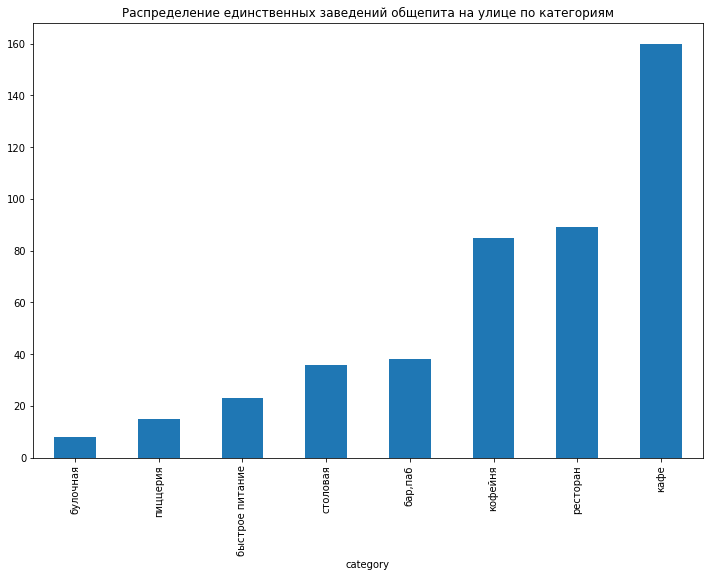

In [100]:
# Построим диаграмму распределения единственных заведений общепита на улице по категориям:

lonely_rests.groupby ('category')['name'].count().sort_values().plot (kind = 'bar', figsize = (12,8))
plt.title ('Распределение единственных заведений общепита на улице по категориям');

Диаграмма показывает распределение единственных на своей улице заведений по категориям. Анализ диаграммы позволяет сделать следующие выводы:
- большая часть таких заведений относятся к категории "кафе" (35%), "ресторан" (20%) или кофейня (18%);
- среди таких заведений крайне мало булочных и пиццерий (2% и 3% соответственно).

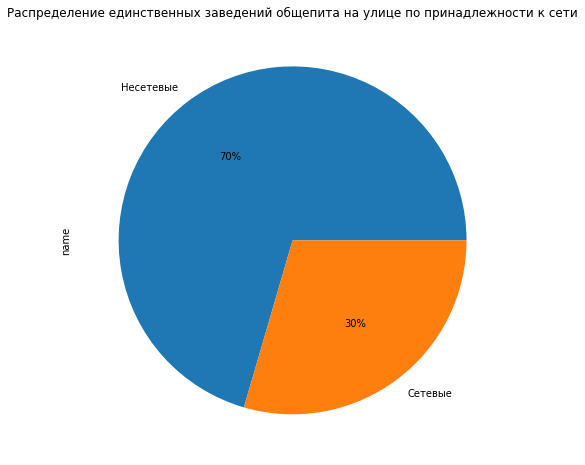

In [101]:
# Построим круговую диаграмму распределения единственных заведений общепита на улице по принадлежности к сети:

lonely_rests.groupby ('chain')['name'].count().plot (
    kind = 'pie', figsize = (12,8), autopct='%1.0f%%', labels = ['Несетевые', 'Сетевые'])
plt.title ('Распределение единственных заведений общепита на улице по принадлежности к сети');

Мы видим, что большинство заведений-"одиночек" являются несетевыми (это может быть связано с тем, что сети открываются на улицах с большим трафиком).

### Распределение среднего чека по районам

In [102]:
# Рассчитаем медианное значение среднего чека для заведений каждого района:

avg_bill_district = data.groupby ('district')['middle_avg_bill'].median().reset_index().sort_values (by = 'middle_avg_bill', ascending = False)
avg_bill_district

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,925.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [103]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=moscow_districts,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

display (m2)

Мы видим, что значение среднего чека по районам распределилось следующим образом:
- самыми дорогими районами предсказуемо стали ЦАО и ЗАО (средний чак равен 1000 и 925 рублей);
- за ними следуют СЗАО и САО (700 и 650 рублей соответственно);
- далее расположились ЮЗАО (600 рублей) и ВАО (550 рублей);
- районами с самыми бюджетными заведениями общепита оказались СВАО и ЮАО (500 рублей) и ЮВАО (450 рублей).

### Другие взаимосвязи

#### Часы работы заведений

In [104]:
# Построим диаграмму, отражающую соотношение заведений с фиксированными часами работы и нефиксированными часами работы:

labels = ['Фиксированные часы работы', 'Нефиксированные часы работы'] 
values = [data ['hours'].str.contains(r'\ежедневно').sum(), (
    data ['hours'].count())-(data ['hours'].str.contains(r'\ежедневно').sum())]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.2, 0])])
fig.update_layout(title_text="Соотношение заведений с фиксированными часами работы и нефиксированными часами работы")
fig.show() 

In [105]:
fig = px.pie (data, names = 'is_24/7', title='Доля заведений, работающих круглосуточно и ежедневно')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [106]:
# Выясним, среди заведений какой категории больше всего открытых 24/7:

category_24_7 = data.pivot_table(index = 'category', values = 'is_24/7', aggfunc = 'count').reset_index()
category_24_7 

# Построим круговую диаграмму:
labels = category_24_7 ['category']
values = category_24_7 ['is_24/7']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent')])
fig.update_layout(title_text="Распределение круглосуточных заведений по категориям")
fig.show() 

#### Особенности заведений с высокими  рейтингами

In [107]:
# Определим границу "высокого рейтинга":

fig = px.box(data, y="rating")
fig.update_layout(title='Диаграммы размаха для значений рейтинга заведений')
fig.show()

Представляется разумным считать высоким рейтинг выше значений 3 квартиля, то есть выше 4.4

In [108]:
high_rating = data [data ['rating']>4.4]
high_rating

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,те самые пончики,кафе,"Москва, природно-исторический парк Кузьминки-Л...",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.695306,37.767886,4.8,NaN,NaN,NaN,NaN,0,NaN,природно-исторический парк Кузьминки-Люблино,False
8375,улица гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN,улица Гурьянова,NaN
8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False
8389,assa,ресторан,"Москва, улица Авиаконструктора Миля, 3А",Юго-Восточный административный округ,"пн-чт 09:00–22:00; пт,сб 09:00–23:00; вс 09:00...",55.686817,37.851225,4.9,NaN,NaN,NaN,NaN,0,NaN,улица Авиаконструктора Миля,False


Мы видим, что в датасете представлено более 2000 заведений с высоким рейтингом. Посмотрим, как они распределены по категориям.

In [109]:
#  Сгруппируем заведения по категориям и отсортируем по убыванию их количества:
high_rating.groupby ('category')['name'].count().sort_values (ascending = False)

category
ресторан           537
кафе               486
кофейня            335
бар,паб            301
пиццерия           144
быстрое питание     79
столовая            68
булочная            61
Name: name, dtype: int64

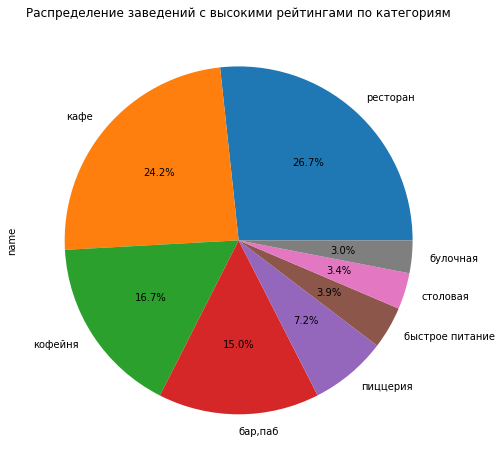

In [110]:
# Построим круговую диаграмму:

high_rating.groupby ('category')['name'].count().sort_values (ascending = False).plot (
    kind = 'pie', figsize = (12,8), title = 'Распределение заведений с высокими рейтингами по категориям', autopct='%1.1f%%');

Можно сделать вывод, что подавляющее чуть больше половины заведений с высокими рейтингами относятся к категориям "ресторан" или "кафе", еще треть - кофейни и бары/пабы, и лишь меньше одной пятой заведений - пиццерии, заведения быстрого питания, столовые и булочные.

#### Особенности заведений с низкими рейтингами

In [111]:
# Определим границу "низкого рейтинга":

fig = px.box(data, y="rating")
fig.update_layout(title='Диаграммы размаха для значений рейтинга заведений')
fig.show()

Представляется разумным считать низким рейтинг ниже значений 1 квартиля, то есть ниже 4.1

In [112]:
low_rating = data [data ['rating']<4.1]
low_rating

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
24,drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True
28,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
36,пекарня № 1 грузинская кухня,кафе,"Москва, Коровинское шоссе, 33А",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,NaN,NaN,NaN,NaN,0,21.0,Коровинское шоссе,False
37,халяль закусочная,кафе,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, 08:00–23:00",55.888023,37.515443,3.9,NaN,NaN,NaN,NaN,0,NaN,Коровинское шоссе,False
39,шаурмагия,быстрое питание,"Москва, Базовская улица, 15А",Северный административный округ,"ежедневно, 09:00–23:00",55.880831,37.510574,4.0,средние,Средний счёт:60–400 ₽,230.0,NaN,0,NaN,Базовская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8392,касабланка,кафе,"Москва, Большая Косинская улица, 27",Восточный административный округ,пн-чт 08:00–17:00; пт 08:00–16:00,55.718514,37.857576,3.3,NaN,NaN,NaN,NaN,0,NaN,Большая Косинская улица,False
8393,doner pro,быстрое питание,"Москва, 11-я улица Текстильщиков, 1",Юго-Восточный административный округ,"ежедневно, 10:00–03:00",55.705155,37.736415,4.0,NaN,NaN,NaN,NaN,0,80.0,11-я улица Текстильщиков,False
8395,истира запрафка,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,NaN,55.724686,37.710558,2.9,NaN,NaN,NaN,NaN,0,NaN,Юго-Восточный административный округ,NaN
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


Заведений с низкими рейтингами в датасете существенно меньше - менее 1700 заведений.

In [113]:
#  Сгруппируем заведения по категориям и отсортируем по убыванию их количества:
low_rating.groupby ('category')['name'].count().sort_values (ascending = False)

category
кафе               716
ресторан           282
быстрое питание    221
кофейня            216
столовая            69
пиццерия            61
бар,паб             60
булочная            41
Name: name, dtype: int64

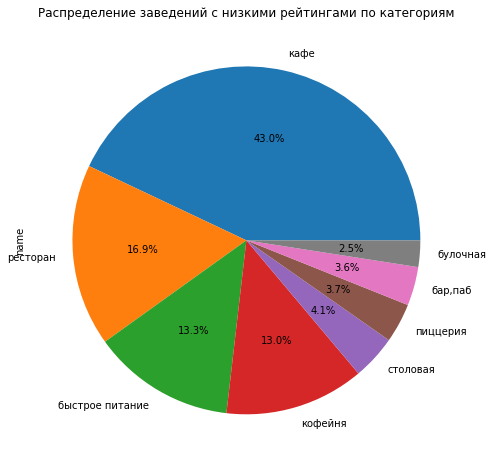

In [114]:
# Построим круговую диаграмму:

low_rating.groupby ('category')['name'].count().sort_values (ascending = False).plot (
    kind = 'pie', figsize = (12,8), title = 'Распределение заведений с низкими рейтингами по категориям', autopct='%1.1f%%');

График показывает, что почти половина заведений с низкими рейтингами относится к категории "кафе", еще 17% - рестораны. По 13% приходятся на долю завеедений быстрого питания и кофейни, еще столько же - на столовые, пиццерии, бары/пабы и булочные.

#### Связь рейтинга и среднего чека

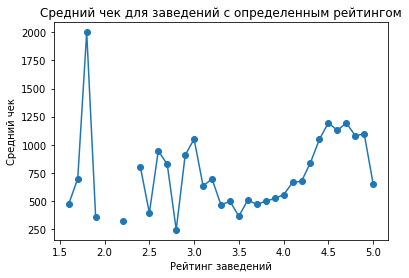

In [115]:
# Построим график соотношения среднего чека для каждого рейтинга заведения:

ax = data.groupby('rating')['middle_avg_bill'].mean()
ax.plot(marker='o', title = 'Средний чек для заведений с определенным рейтингом')
plt.xlabel('Рейтинг заведений')
plt.ylabel('Средний чек');

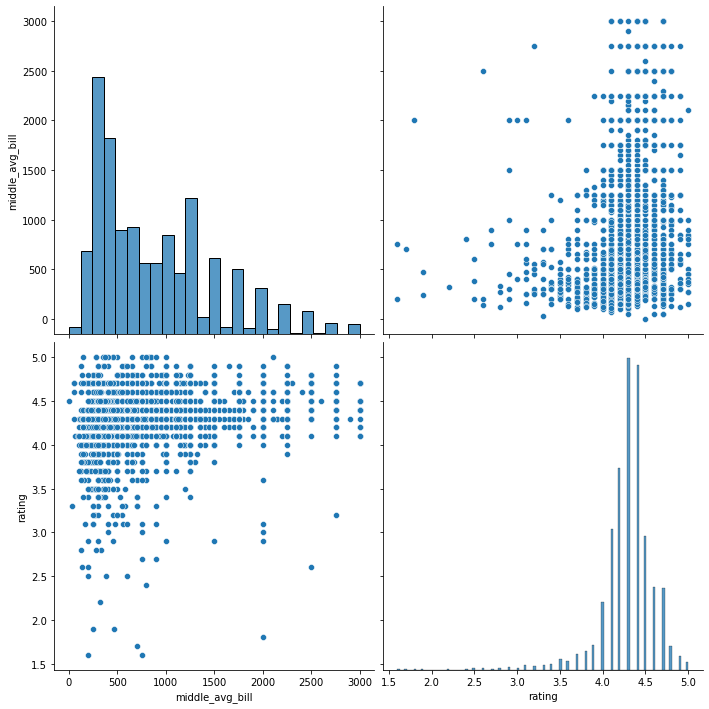

In [116]:
# Построим график совместного распределения для заведений со средним чеком:

sns.pairplot(data[['middle_avg_bill', 'rating']].dropna(), height=5) 

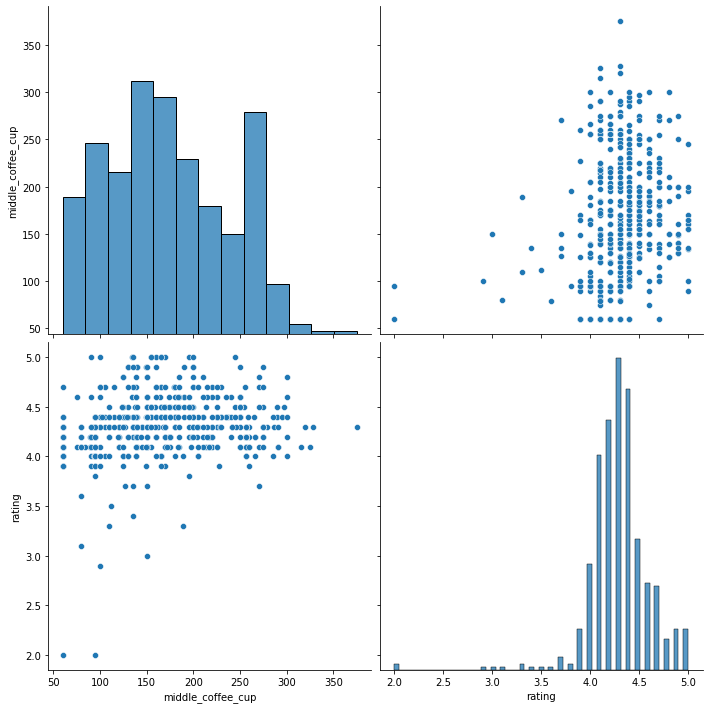

In [117]:
# Построим график совместного распределения для заведений со средней чашкой капучино:

sns.pairplot(data[['middle_coffee_cup', 'rating']].dropna(), height=5) 

Анализ графиков совместного распределения показывает, что корреляции между рейтингом и средним чеком не обнаружено

### Вывод на основе проведенного анализа 

## Детализация исследования: анализ рынка кофеен

In [118]:
# Посчитаем количество кофеен в датасете:

coffee = data[data['category']=='кофейня']

print ('Всего кофеен:', coffee['name'].count())

Всего кофеен: 1412


In [119]:
# Рассчитаем количество кофеен в каждом районе Москвы:

coffee.groupby ('district')['name'].count().reset_index().sort_values (by = 'name', ascending = False)

,district,name
5,Центральный административный округ,427
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [120]:
# Нанесем на карту все кофейни:

m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим пустой кластер:
marker_cluster = MarkerCluster().add_to(m3)

# Напишем функцию create_clusters, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# создаем хороплет и добавляем его на карту:
Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby ('district')['name'].count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Количество кофеен в районе',
).add_to(m3)

# выводим карту
m3

Мы видим, что наибольшее число кофеен сосредоточено в ЦАО (428), за ним с большим отрывом следует САО (193). Ощутимо меньше кофеен в СВАО (159), ЗАО (150) и ЮАО (131). Еще меньше кофеен представлено в ВАО (105), ЮЗАО (96) и ЮВАО (89), а наименьшее количество кофеен в СЗАО - всего 62 кофейни.

Что же касается особенностей расположения, то мы видим, что кофейни часто расположены вдоль основных магистралей, проспектов и улиц, а также в торговых и деловых центрах.

In [121]:
# Проверим, есть ли круглосуточные кофейни:

print ('Всего круглосуточных кофеен:', coffee[coffee['is_24/7']==True]['name'].count())

Всего круглосуточных кофеен: 59


In [122]:
# Построим диаграмму, отражающую долю круглосуточных кофеен:

labels = ['Круглосуточные кофейни', 'Ограниченные часы работы'] 
values = [coffee[coffee['is_24/7']==True]['name'].count(), (
    coffee ['name'].count())-(coffee[coffee['is_24/7']==True]['name'].count())]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.2, 0])])
fig.update_layout(title_text="Доля круглосуточных кофеен")
fig.show() 

In [123]:
# Проверим рейтинги кофеен:

coffee['rating'].describe()

count    1412.000000
mean        4.277054
std         0.372283
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Средний и медианный рейтинг кофеен - 4.3 (что является достаточно высоким показателем), причем мы видим очень низкое значение стандартного отклонения, что подтверждает низкое число аномалий и выбросов. 

Теперь проверим распределение рейтинга кофеен по районам:

In [124]:
coffee.groupby ('district')['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False)

,district,rating
5,Центральный административный округ,4.335831
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [125]:
# загрузим карту Москвы
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby ('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m4)

display (m4)

Фоновая картограмма показала следующее распределение среднего рейтинга кофеен по районам Москвы:
- самые высокие рейтинги у кофеен в ЦАО и СЗАО (средний рейтинг равен 4.33);
- чуть ниже средний рейтинг кофеен в САО (4.29);
- далее следуют ЮЗАО и ВАО (4.28);
- за ними расположились ЮАО и ЮВАО (4.23 и 4.22 соответственно);
- замыкают рейтинг СВАО (4.21) и ЗАО (4.19).

In [126]:
# Рассчитаем подходящую стоимость чашки капучино:

coffee ['middle_coffee_cup'].describe()

count    521.000000
mean     172.545106
std       65.816633
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Мы видим достаточно широкий диапазон цен: от 60 до 1500 рублей за чашку капучино. При этом медианное и среднее значение практически не отличаются и составляют около 170 рублей за чашку капучино.

Теперь узнаем среднюю стоимость чашки капучино по районам:

In [127]:
coffee.groupby ('district')['middle_coffee_cup'].mean().reset_index().sort_values(
    by='middle_coffee_cup', ascending = False)

,district,middle_coffee_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,151.088235
0,Восточный административный округ,142.880952


In [128]:
# загрузим карту Москвы
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby ('district')['middle_coffee_cup'].mean().reset_index(),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.7,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m5)

display (m5)

Мы видим, что средняя стоимость чашки капучино различается в зависимости от района. Так, дороже всего кофе обойдется в ЦАО, ЮЗАО и ЗАО (в среднем 190 рублей), чуть дешевле в ВАО (около 180), еще дешевле в СЗАО, САО, СВАО (около 170 рублей) и ЮАО (около 160 рублей), а самый низкий показатель в ЮВАО (около 150 рублей). 

При этом при определении цены следует принимать во внимание и другие параметры, такие как стоимость аренды помещения, затраты на персонал, электричество и продукты. 

**Выводы и рекомендации:** на основании проведенного анализа рекомендуется для открытия кофейни выбрать Северо-Западный административный округ, поскольку: 
- в этом районе представлено не так много кофеен, как в других районах Москвы, при этом это район с хорошо развитой инфраструктурой, парками и плотной жилой застройкой;
- средний чек заведений в данном районе выше среднего по Москве, что свидетельствует о потенциально более платежеспособных клиентах;
- большая часть имеющихся в районе кофеен относится к сетям из топ-15 популярных сетей, поэтому открытие новой кофейни может способствовать притоку клиентов, которым надоели однотипные сетевые кофейни.

## Визуализация результатов

Презентация: https://drive.google.com/file/d/1vyucA_-6f0MYTyn5EcFTTg3KxksmZkZR/view?usp=sharing